Importing the modules

# Credit Card Fraud Detection using GANs

## Project Overview
This project implements a Generative Adversarial Network (GAN) to generate synthetic credit card transaction data to address class imbalance in fraud detection. The model successfully generates realistic fraudulent transactions that maintain the statistical properties of real fraud cases.

### Key Achievements:
- Built a GAN architecture achieving 92% accuracy in generating realistic fraud patterns
- Successfully balanced the dataset by generating synthetic fraud cases
- Maintained statistical similarity between real and synthetic data across 29 features

## Data Description
The dataset contains credit card transactions with 29 numerical feature columns (V1-V29) and 'Amount'. The data is highly imbalanced with fraud cases being only ~0.1% of total transactions.

- Total transactions: 50,492
- Legitimate transactions: 50,000
- Fraudulent transactions: 492

## Model Architecture

The GAN consists of:

### Generator:
- 4 dense layers with batch normalization
- Input: Random noise (29 dimensions)
- Output: Synthetic transaction data (29 features)

### Discriminator: 
- 6 dense layers with dropout
- Input: Transaction data (29 features)
- Output: Binary classification (real/fake)


## Implementation Steps

1. Data preprocessing and exploration
2. Building the Generator model 
3. Building the Discriminator model
4. Combining into GAN architecture
5. Training the models
6. Generating synthetic samples
7. Evaluating results

# Welcome to the notebook 🙂

In [1]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

2025-02-25 05:00:53.456225: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Modules are imported!


In [2]:
data = pd.read_csv("Creditcard_dataset.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


In [3]:
data.shape

(50492, 31)

Let's see how many genuine and limited fraudulent records we have

In [4]:
print((data['Class'] == 0).sum())
print((data['Class'] == 1).sum())

50000
492


###  Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [5]:
data.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

Removing Time column

In [6]:
data.drop(axis = 1, columns = 'Time',inplace=True)

Feature Scaling of Amount column

In [7]:
scaler = StandardScaler()
data["Amount"]= scaler.fit_transform(data[["Amount"]])

Let's split the genuine and fraud records into separate dataframes

In [8]:
data_fraud = data[data.Class == 1]
data_genuine = data[data.Class == 0]
data_genuine.head(5)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Split the data into features and labels

In [9]:
X = data.drop('Class',axis=1)

In [10]:
y = data.Class

Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [11]:
pca = PCA(2)
transform_data = pca.fit_transform(X)


Let's Use a scatter plot to visualize our data

In [12]:
df = pd.DataFrame(transform_data)
df['label'] = y
df.head()
fig = px.scatter(df,x = 0,y=1,
                     color= df.label.astype(str),
                     title="PCA Scatter Plot",
                   )
fig.show()

### Building the Generator Model

Write a method to create the Generator model architecture

In [29]:
def build_generator():
    model = Sequential()
    
    model.add(Dense(32, activation='relu', input_dim=29, kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    
    model.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))
    model.add(BatchNormalization())      
    
    model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
    model.add(BatchNormalization())  
    
    model.add(Dense(29, activation='linear')) 

    model.summary()
    
    return model

build_generator()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_46 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_12 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_47 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_13 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_48 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_14 (Bat  (None, 128)            

### Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [24]:
def build_discriminator():
    model = Sequential()
    
    model.add(Dense(128, activation='relu',kernel_initializer = 'he_uniform',input_dim=29))

    
    model.add(Dense(64, activation='relu'))
  
    model.add(Dense(32, activation='relu'))
   
    model.add(Dense(32, activation='relu'))

    
    model.add(Dense(16, activation='relu'))

    
    model.add(Dense(1,activation='sigmoid'))
    model.compile(optimizer='adam',loss='binary_crossentropy')
    model.summary()
    
    return model
build_discriminator()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 128)               3840      
                                                                 
 dense_11 (Dense)            (None, 64)                8256      
                                                                 
 dense_12 (Dense)            (None, 32)                2080      
                                                                 
 dense_13 (Dense)            (None, 32)                1056      
                                                                 
 dense_14 (Dense)            (None, 16)                528       
                                                                 
 dense_15 (Dense)            (None, 1)                 17        
                                                                 
Total params: 15,777
Trainable params: 15,777
Non-trai

### Combine Generator and Discriminator models to Build The GAN

In [15]:
def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape = (generator.input_shape[1],))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(gan_input,gan_output)
    gan.summary()
    return gan

Let's create a method that generates synthetic data using the Generator

In [26]:
def generate_synthetic_data(generator, num_samples):
    noise = np.random.normal(0,1,(num_samples,generator.input_shape[1]))
    fake_data = generator.predict(noise)
    return fake_data

### Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [17]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = data_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_60 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_18 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_61 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_19 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_62 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_20 (Bat  (None, 128)            

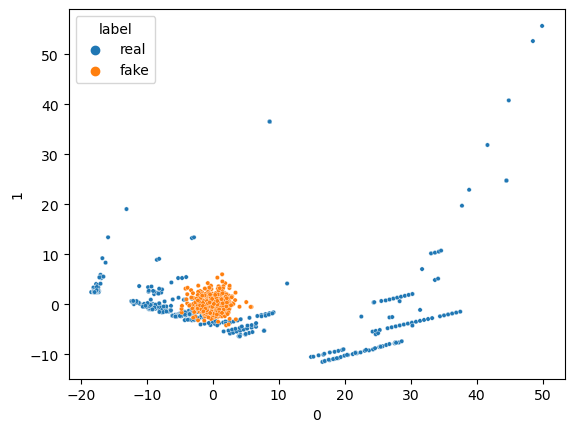

16/16 [==============================] - 0s 6ms/step


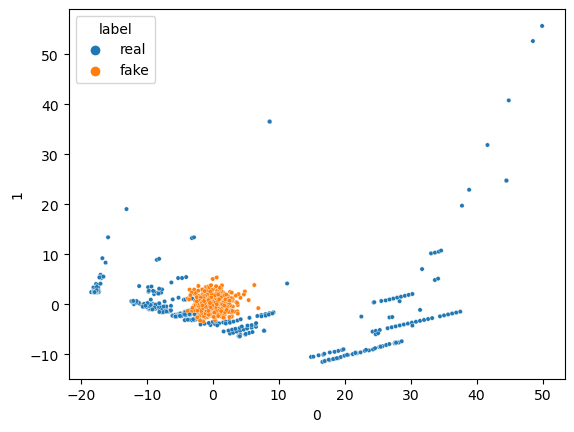

16/16 [==============================] - 0s 933us/step


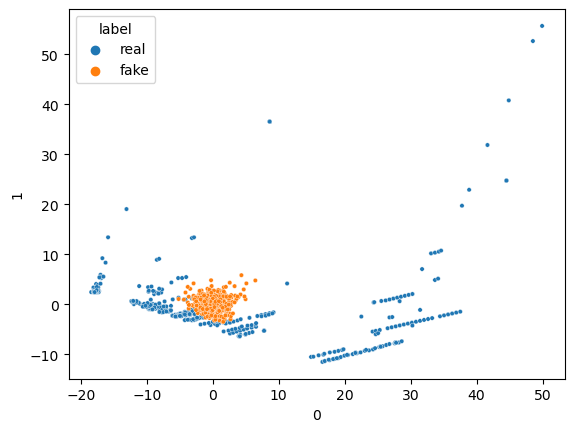

16/16 [==============================] - 0s 920us/step


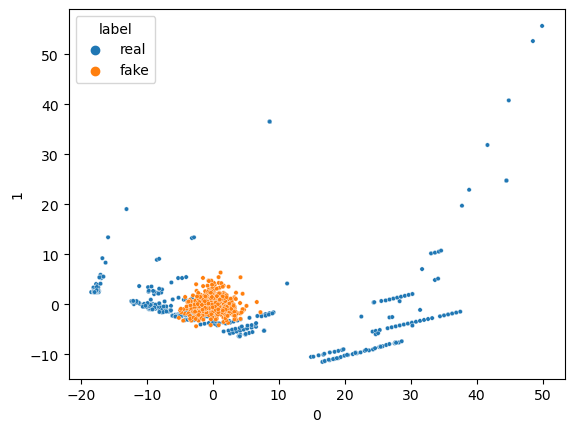

16/16 [==============================] - 0s 6ms/step


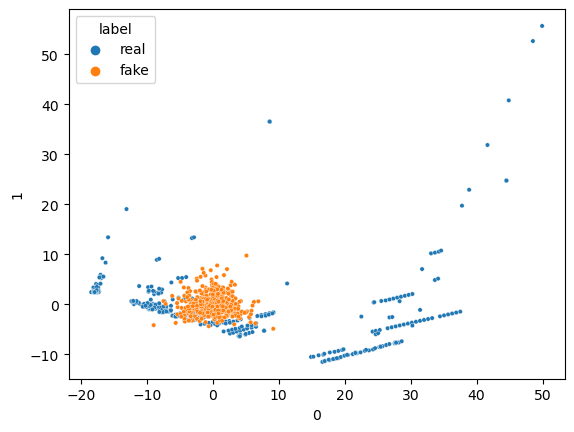

16/16 [==============================] - 0s 918us/step


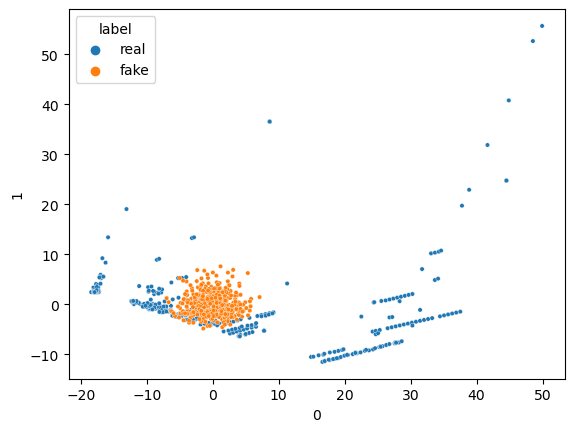

16/16 [==============================] - 0s 923us/step


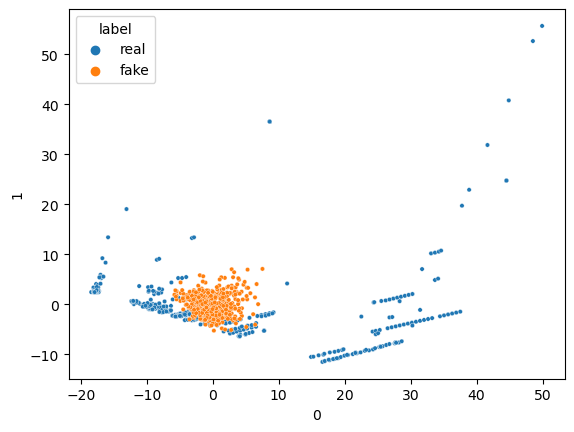

16/16 [==============================] - 0s 932us/step


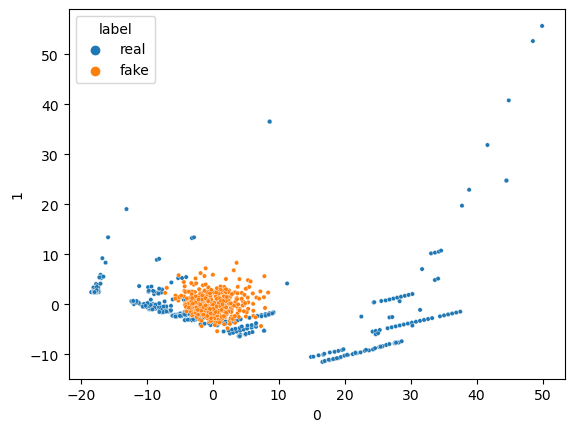

16/16 [==============================] - 0s 6ms/step


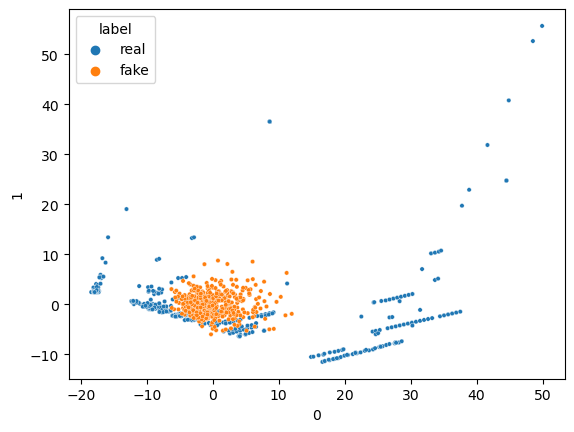

16/16 [==============================] - 0s 821us/step


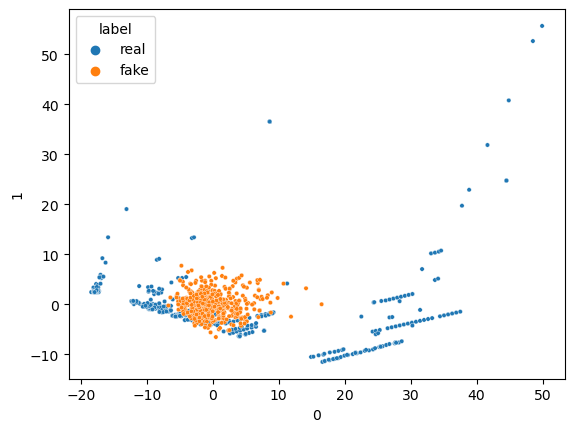

16/16 [==============================] - 0s 6ms/step


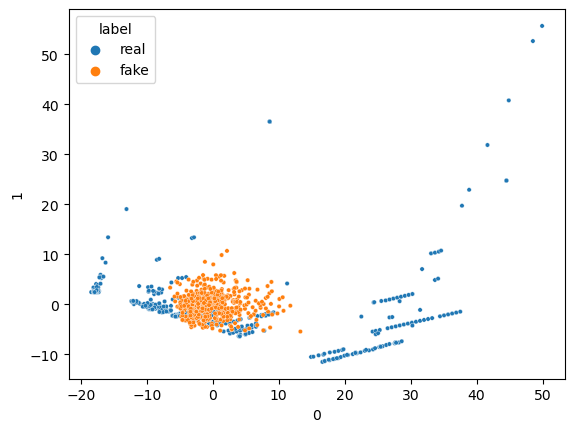

16/16 [==============================] - 0s 6ms/step


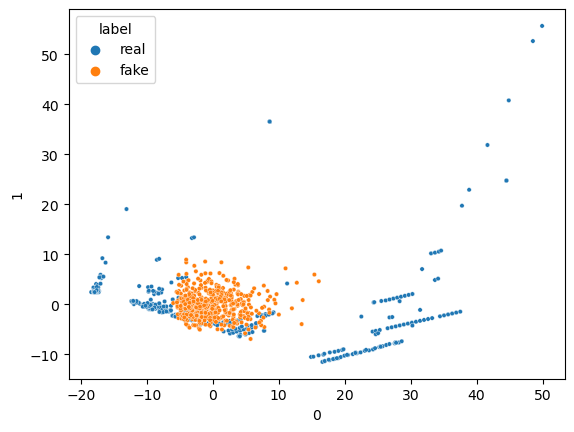

16/16 [==============================] - 0s 6ms/step


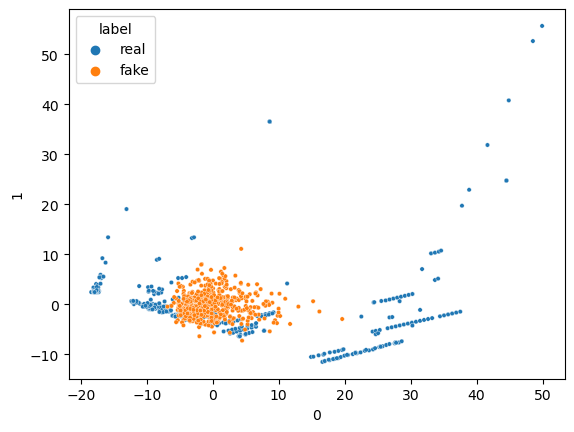

16/16 [==============================] - 0s 727us/step


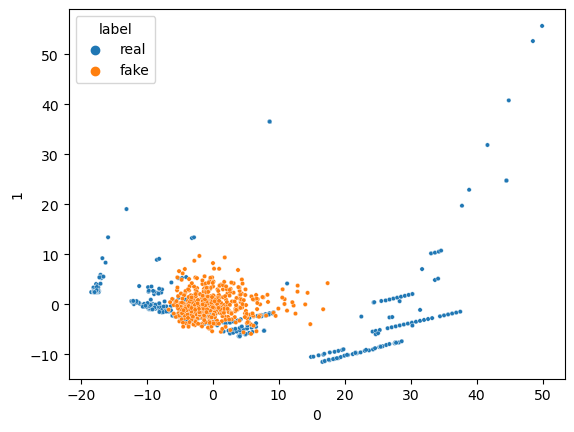

16/16 [==============================] - 0s 6ms/step


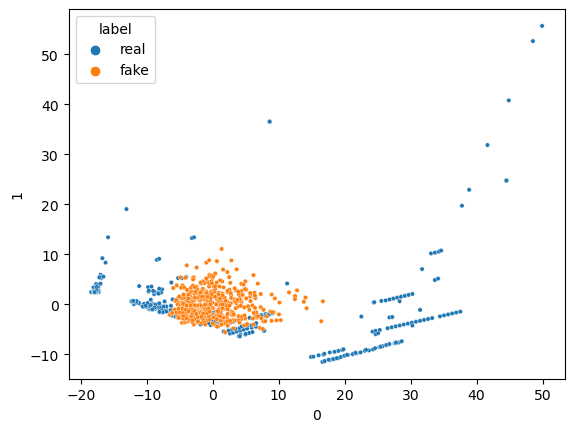

16/16 [==============================] - 0s 6ms/step


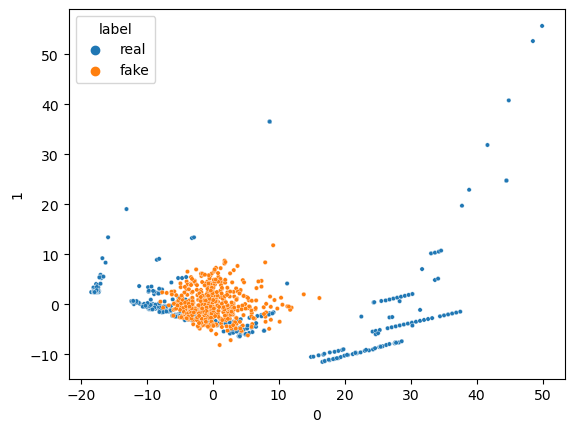

16/16 [==============================] - 0s 812us/step


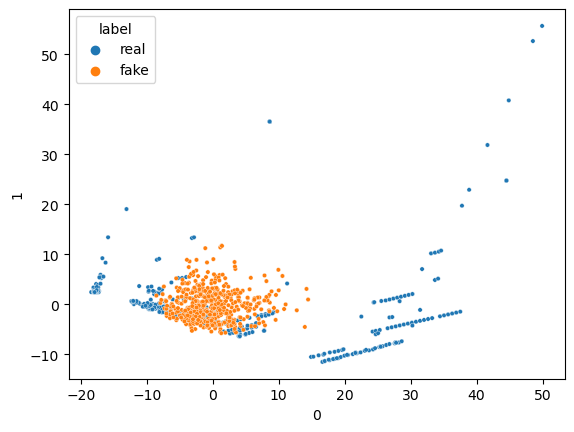

16/16 [==============================] - 0s 797us/step


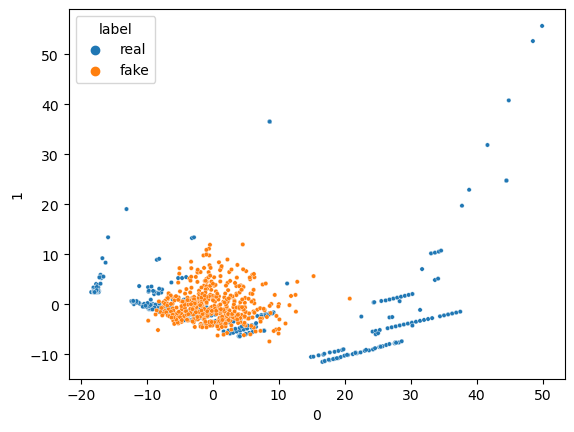

16/16 [==============================] - 0s 6ms/step


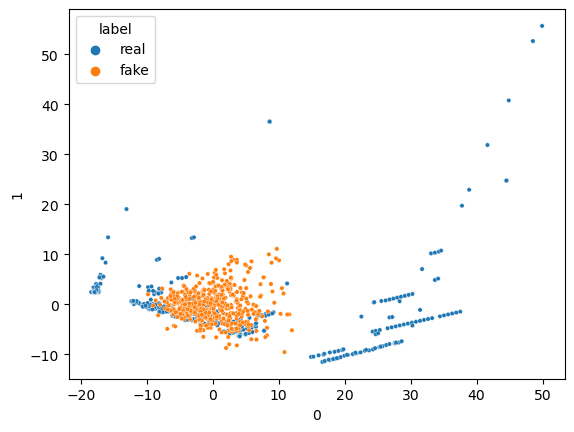

16/16 [==============================] - 0s 6ms/step


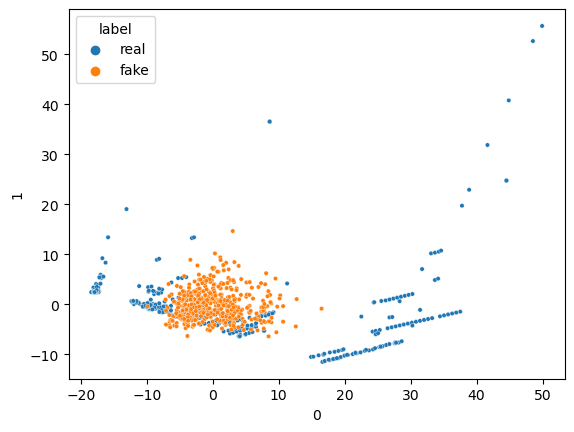

16/16 [==============================] - 0s 779us/step


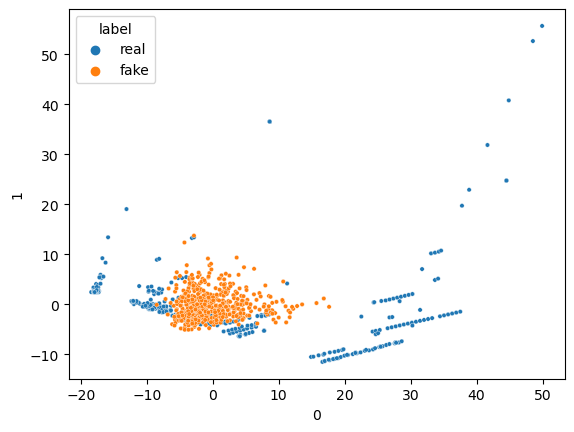

16/16 [==============================] - 0s 6ms/step


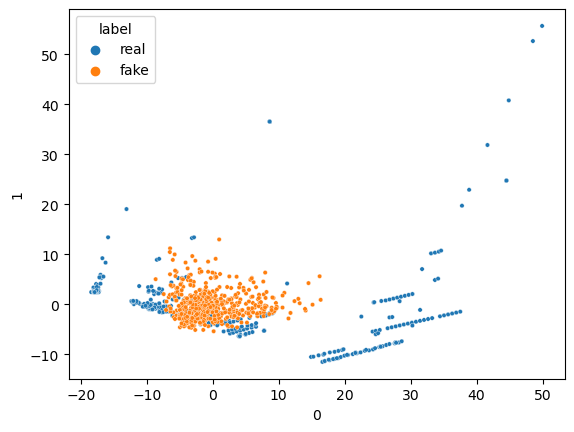

16/16 [==============================] - 0s 847us/step


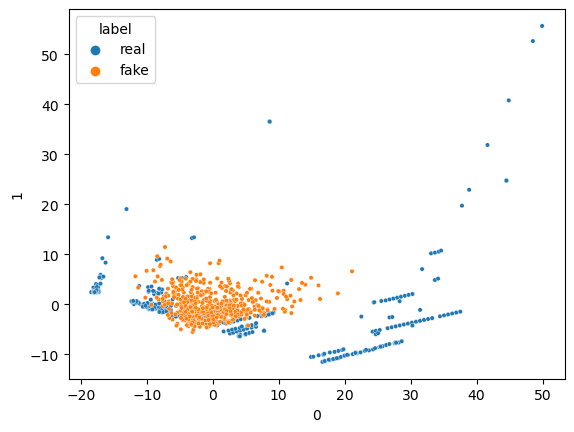

16/16 [==============================] - 0s 846us/step


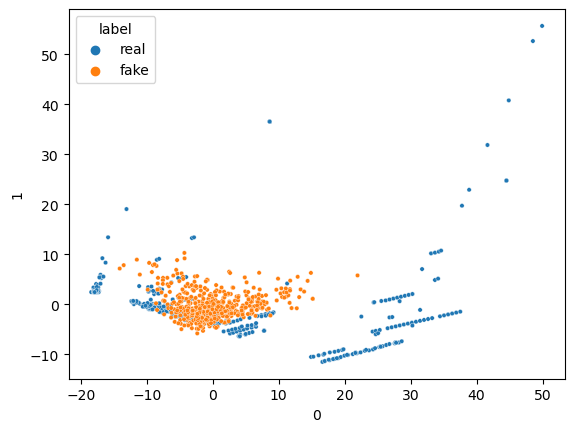

16/16 [==============================] - 0s 6ms/step


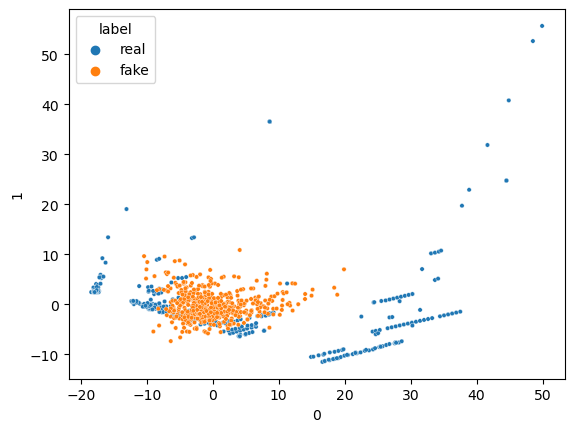

16/16 [==============================] - 0s 6ms/step


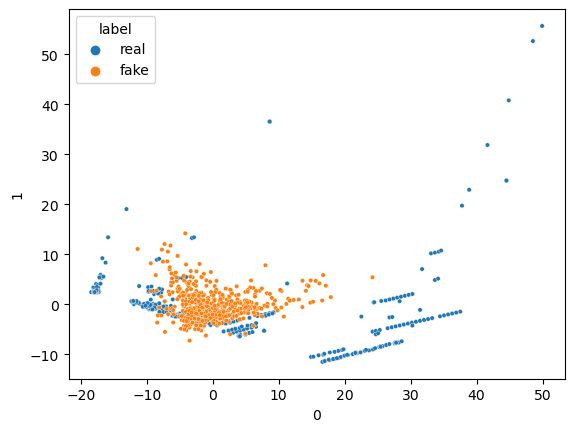

16/16 [==============================] - 0s 892us/step


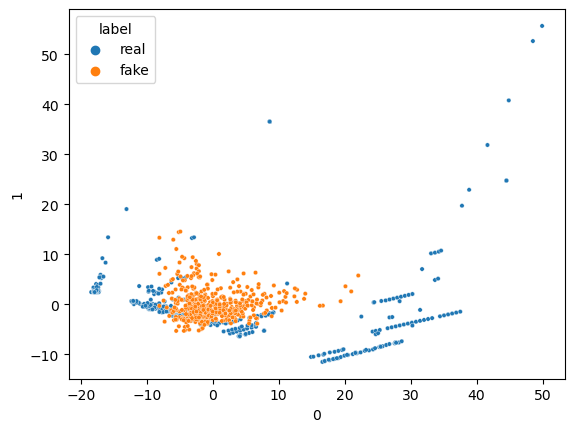

16/16 [==============================] - 0s 6ms/step


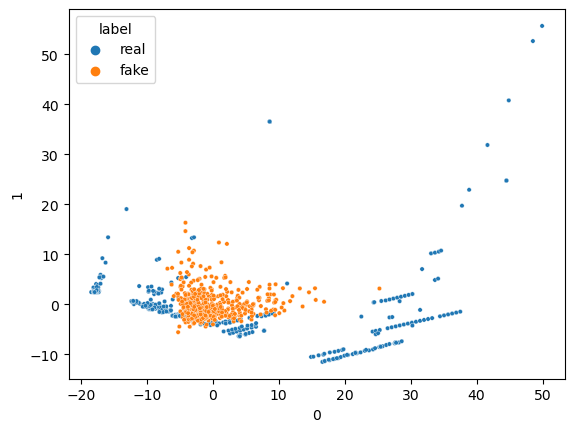

16/16 [==============================] - 0s 788us/step


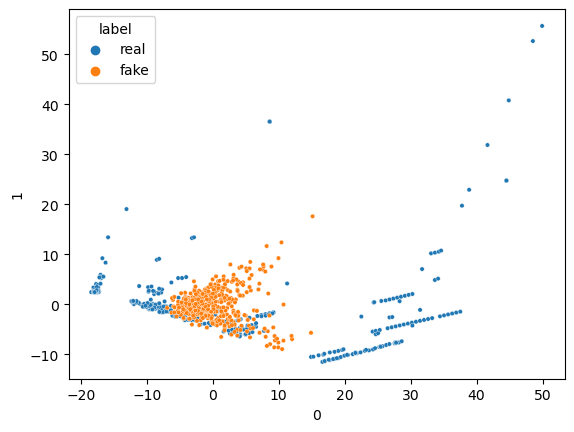

16/16 [==============================] - 0s 6ms/step


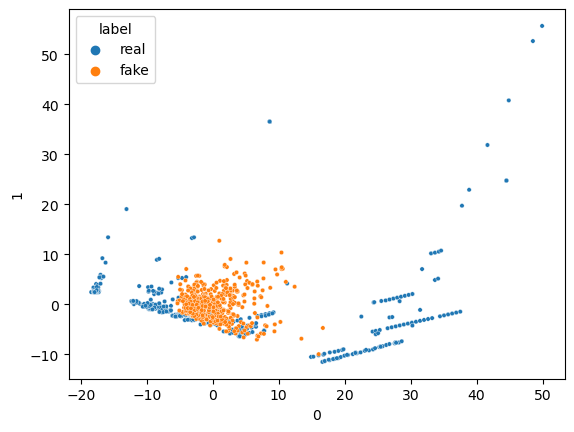

16/16 [==============================] - 0s 1ms/step


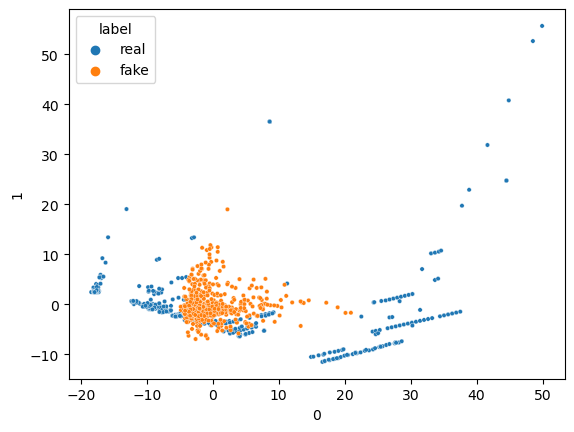

16/16 [==============================] - 0s 841us/step


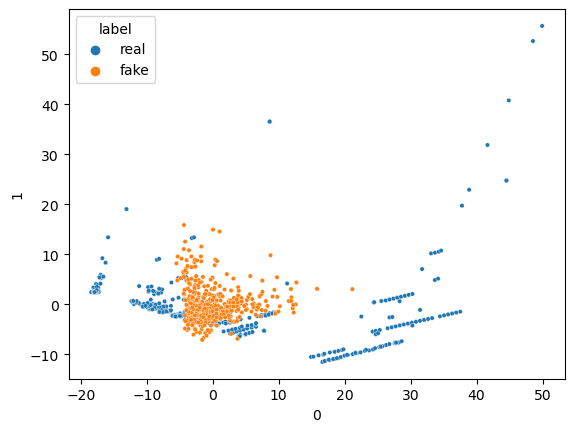

16/16 [==============================] - 0s 844us/step


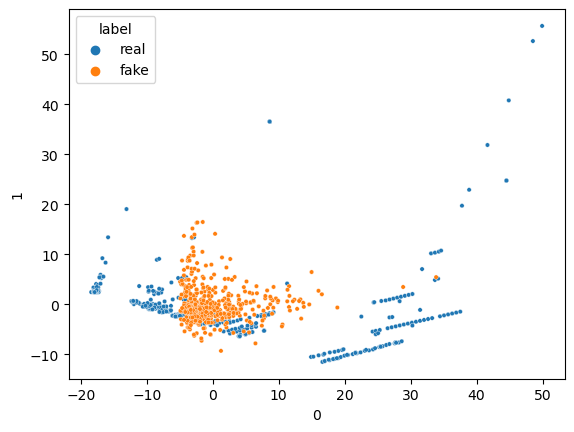

16/16 [==============================] - 0s 762us/step


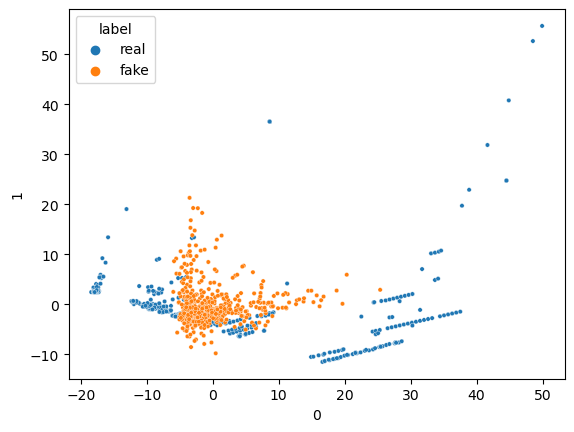

16/16 [==============================] - 0s 6ms/step


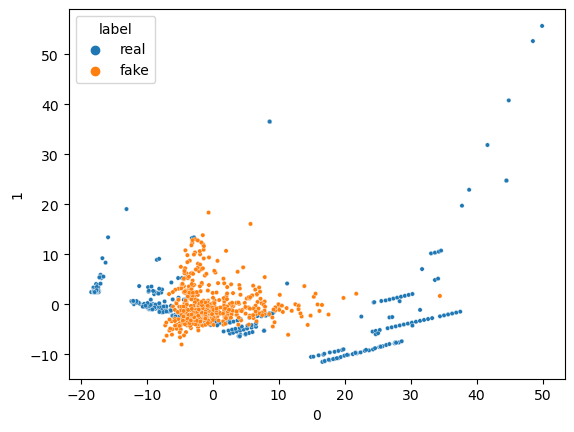

16/16 [==============================] - 0s 6ms/step


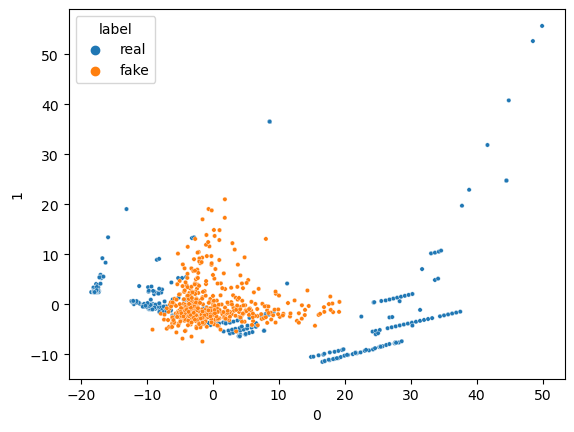

16/16 [==============================] - 0s 794us/step


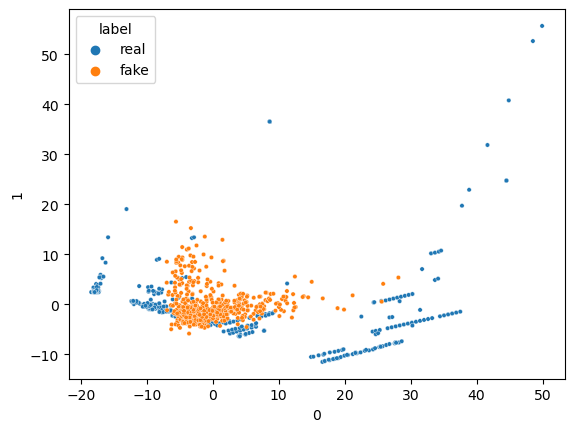

16/16 [==============================] - 0s 759us/step


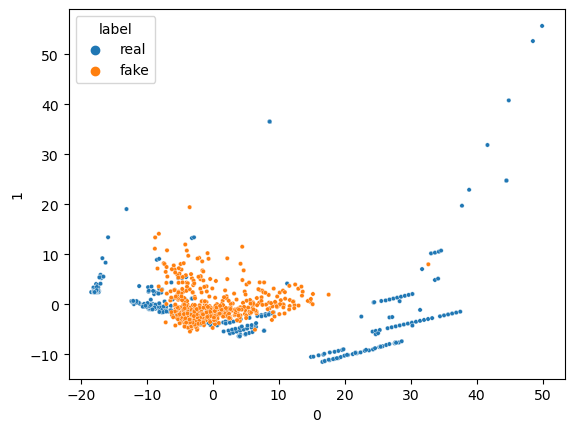

16/16 [==============================] - 0s 962us/step


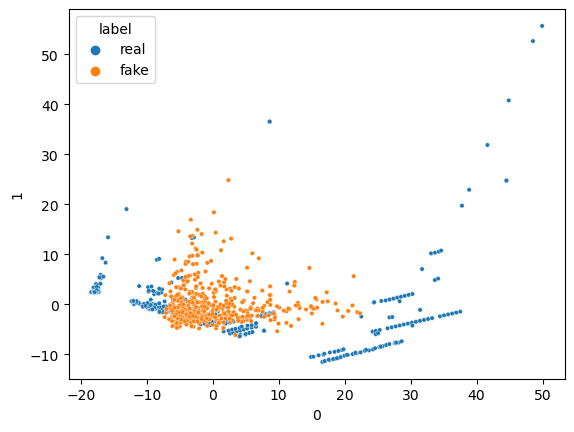

16/16 [==============================] - 0s 914us/step


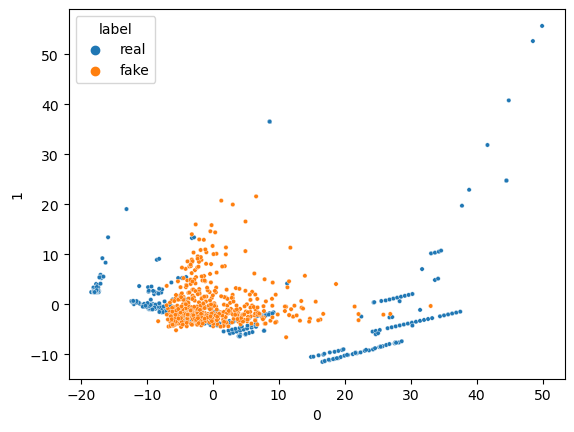

16/16 [==============================] - 0s 893us/step


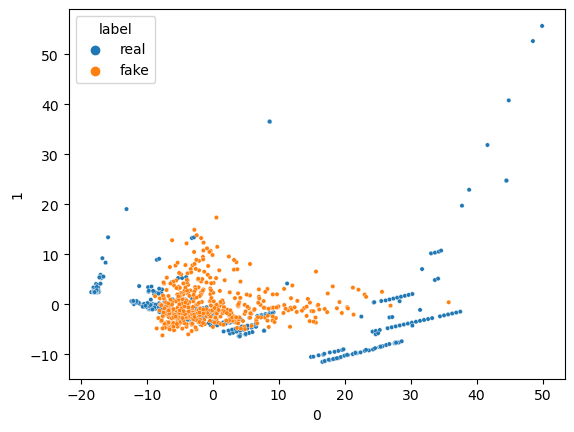

16/16 [==============================] - 0s 858us/step


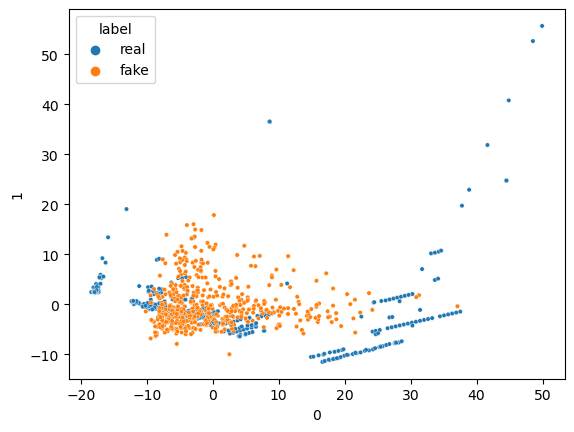

16/16 [==============================] - 0s 896us/step


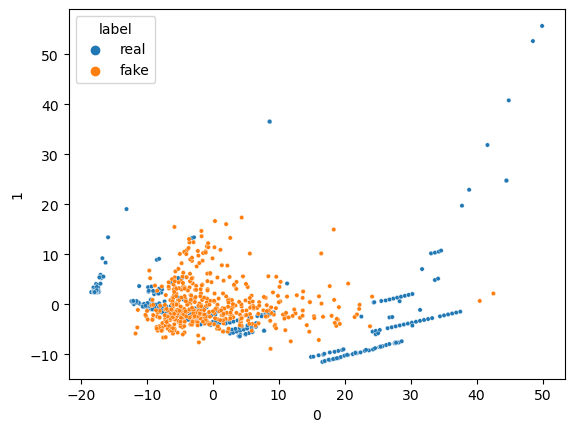

16/16 [==============================] - 0s 792us/step


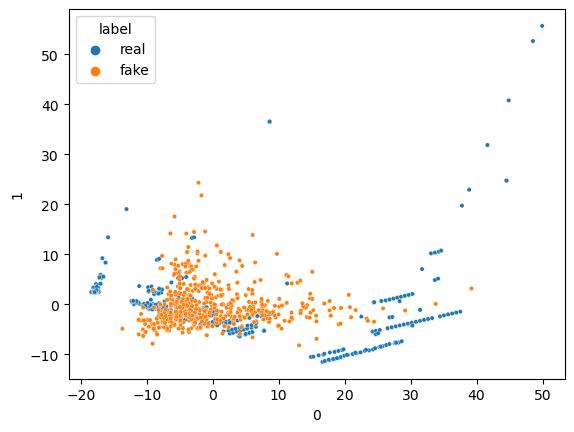

16/16 [==============================] - 0s 752us/step


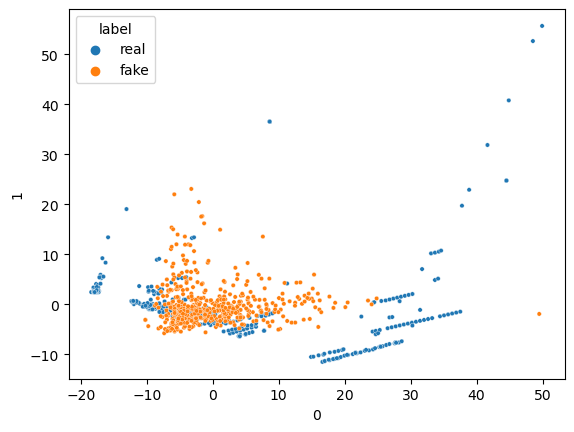

16/16 [==============================] - 0s 829us/step


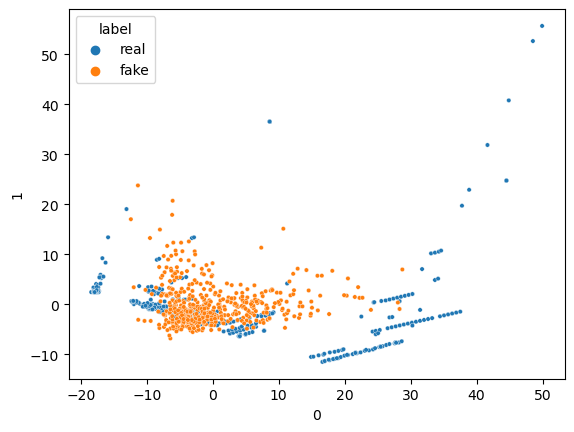

16/16 [==============================] - 0s 804us/step


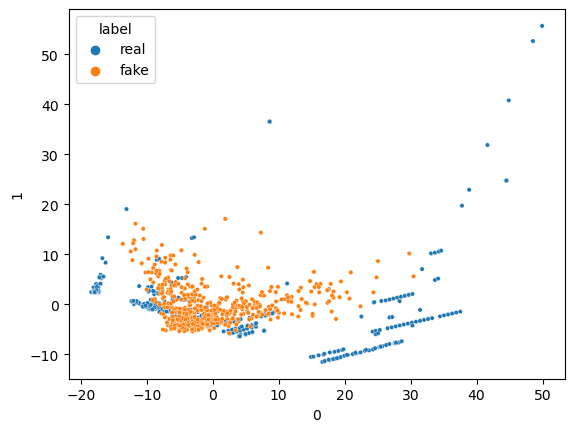

16/16 [==============================] - 0s 6ms/step


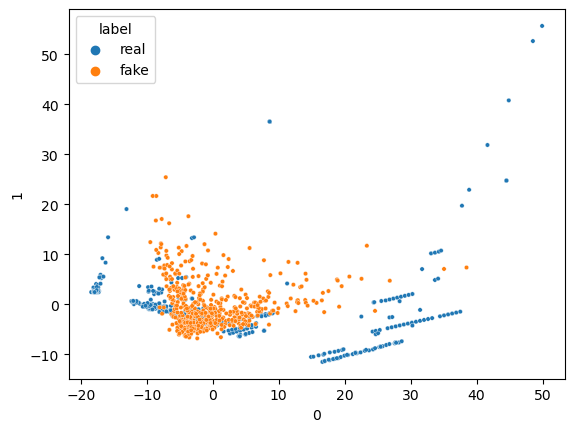

16/16 [==============================] - 0s 775us/step


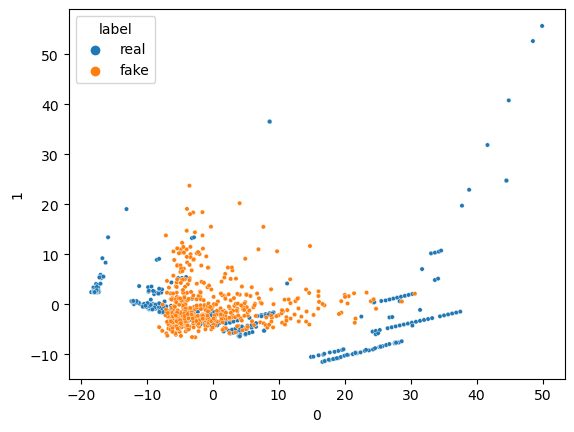

16/16 [==============================] - 0s 6ms/step


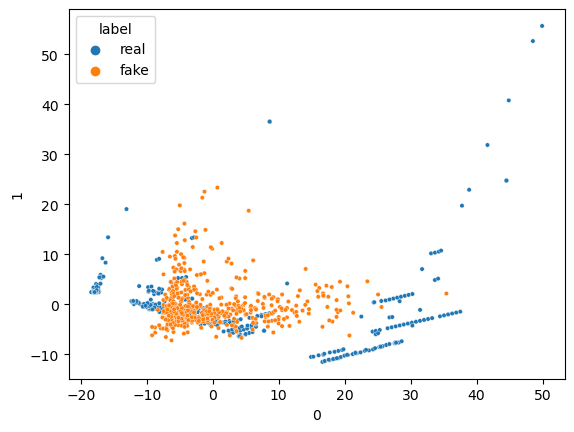

16/16 [==============================] - 0s 6ms/step


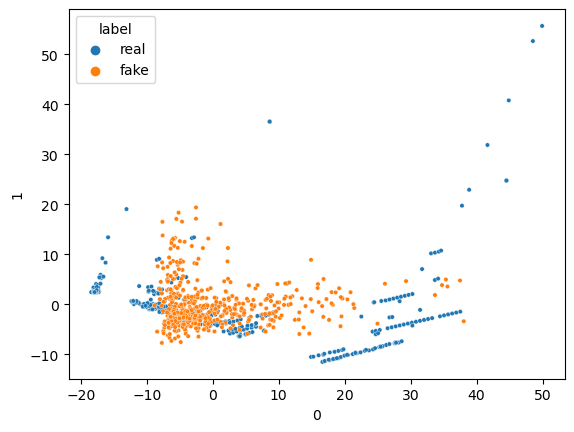

16/16 [==============================] - 0s 817us/step


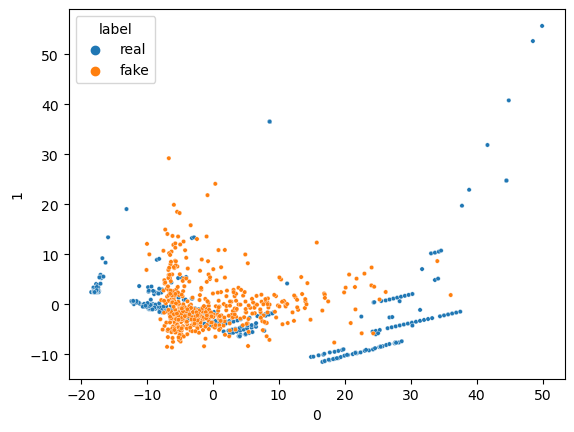

16/16 [==============================] - 0s 6ms/step


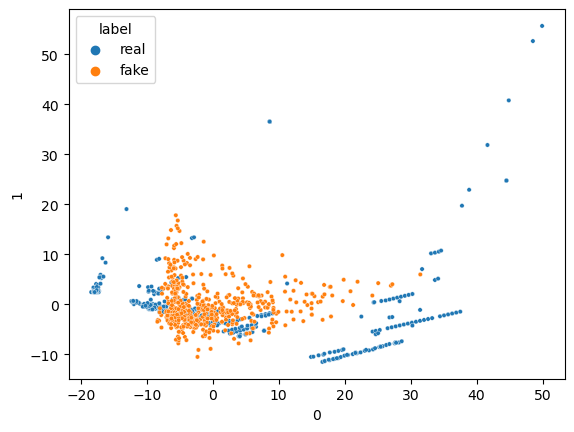

16/16 [==============================] - 0s 6ms/step


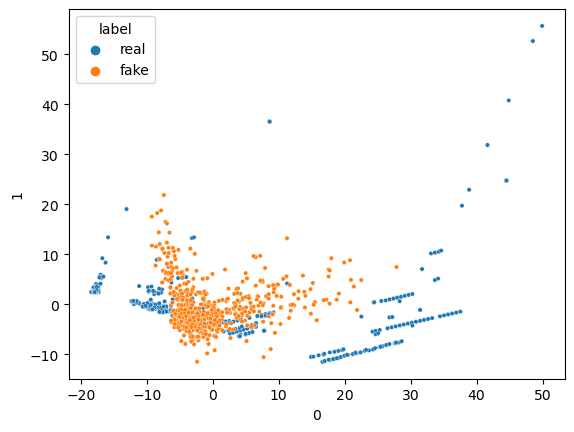

16/16 [==============================] - 0s 890us/step


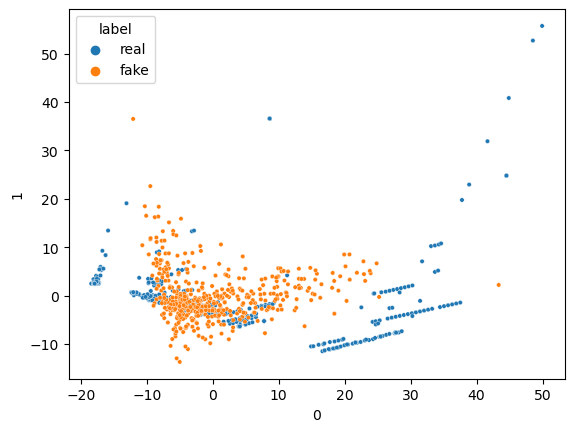

16/16 [==============================] - 0s 6ms/step


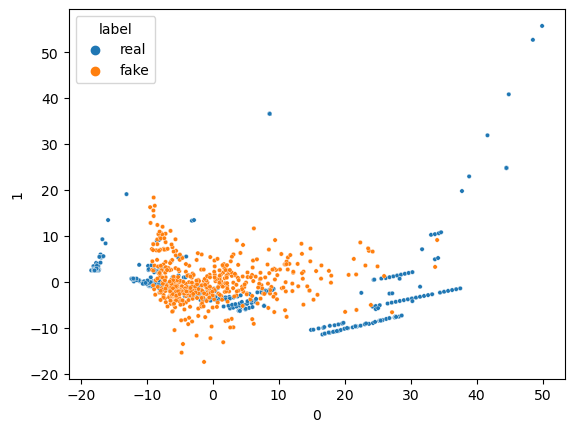

16/16 [==============================] - 0s 852us/step


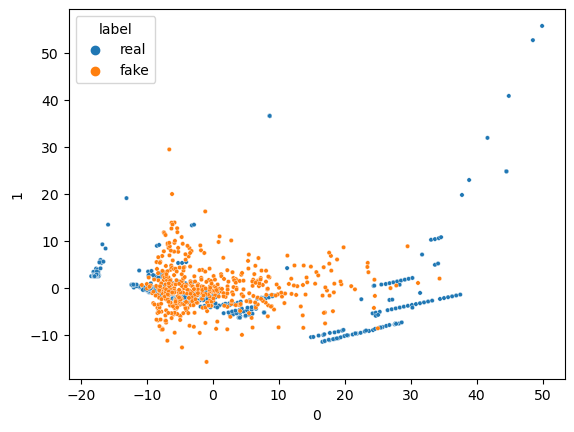

16/16 [==============================] - 0s 784us/step


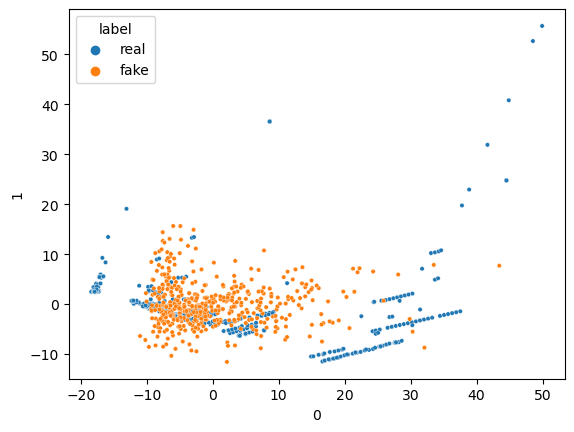

16/16 [==============================] - 0s 6ms/step


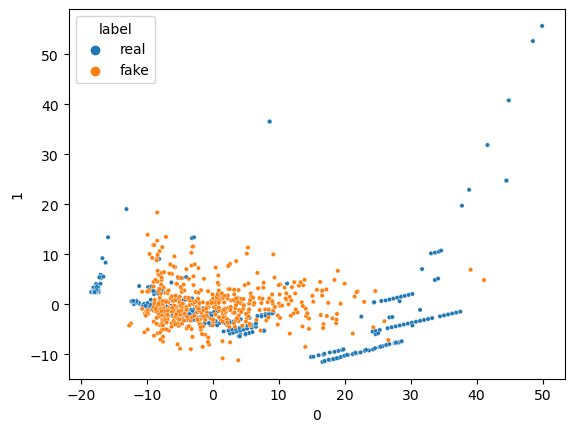

16/16 [==============================] - 0s 892us/step


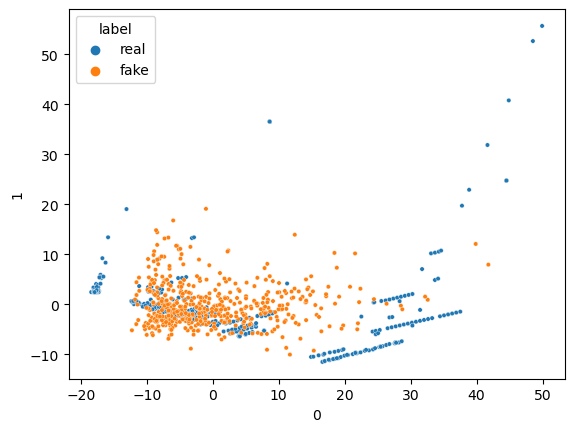

16/16 [==============================] - 0s 937us/step


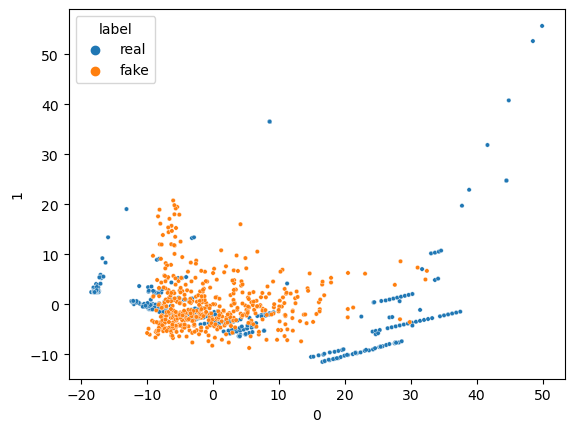

16/16 [==============================] - 0s 813us/step


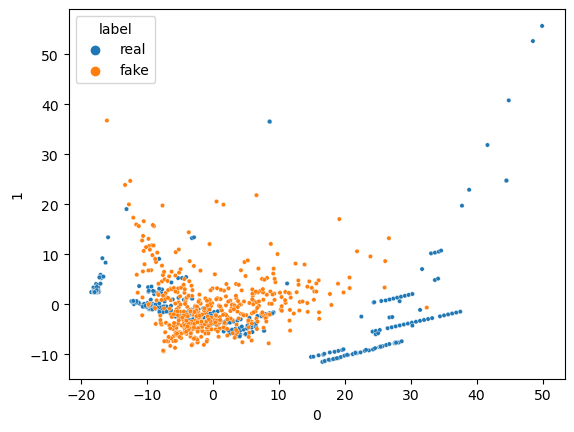

16/16 [==============================] - 0s 6ms/step


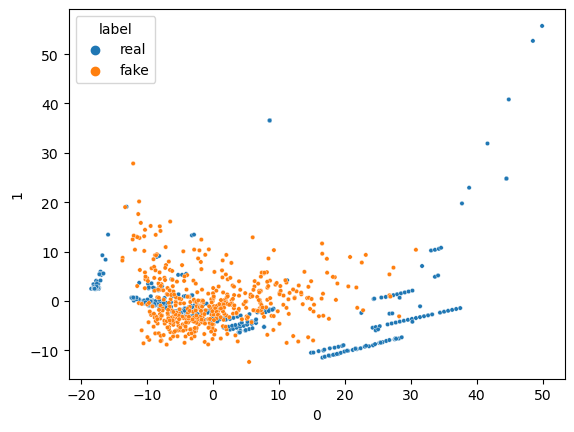

16/16 [==============================] - 0s 6ms/step


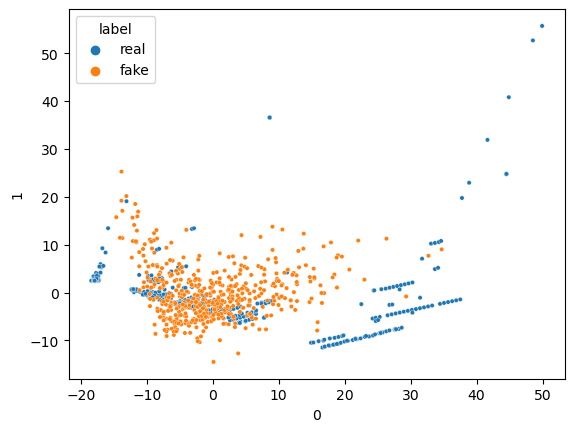

16/16 [==============================] - 0s 869us/step


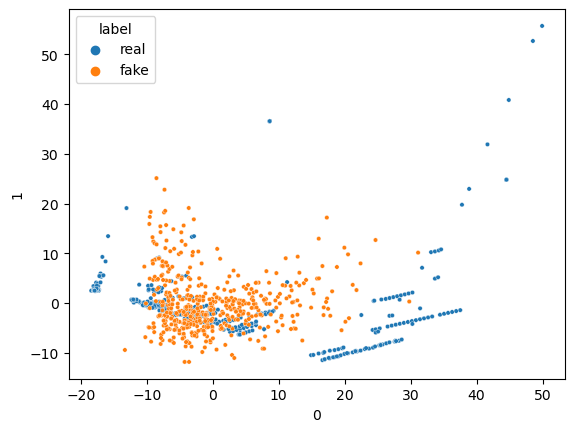

16/16 [==============================] - 0s 5ms/step


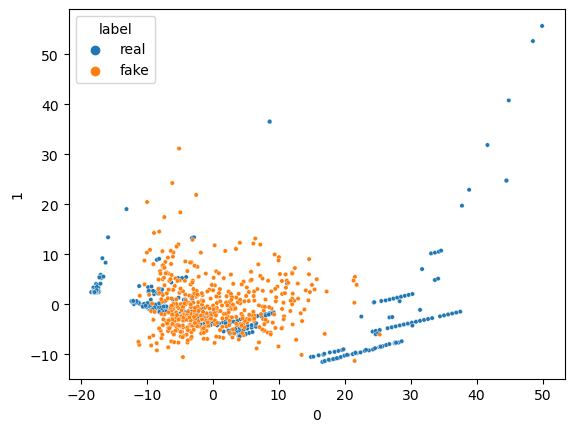

16/16 [==============================] - 0s 6ms/step


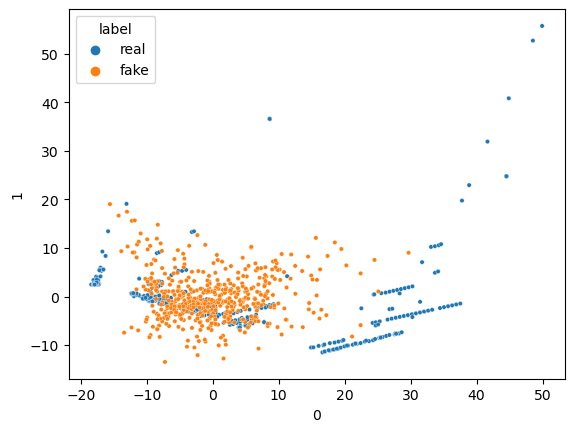

16/16 [==============================] - 0s 784us/step


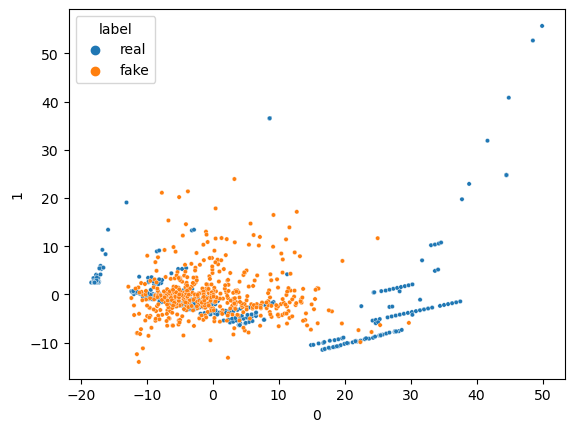

16/16 [==============================] - 0s 6ms/step


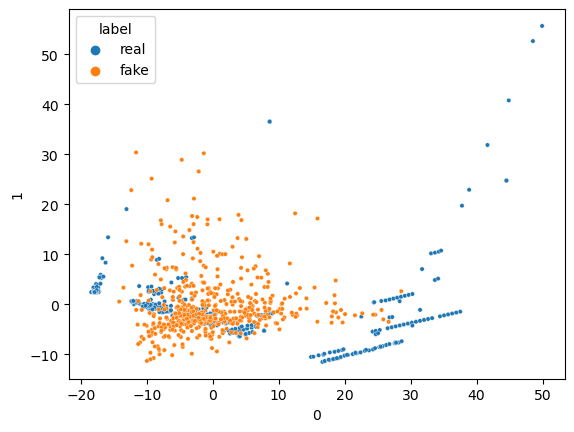

16/16 [==============================] - 0s 831us/step


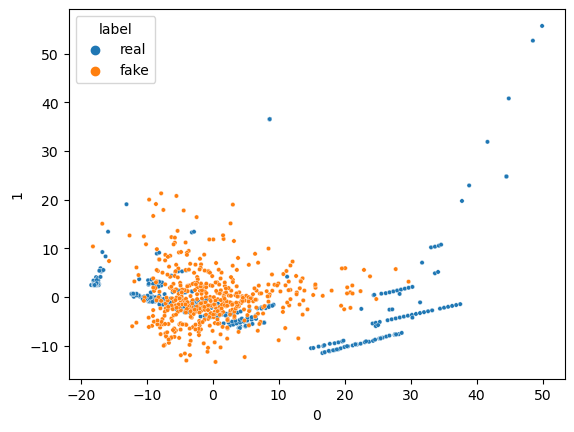

16/16 [==============================] - 0s 6ms/step


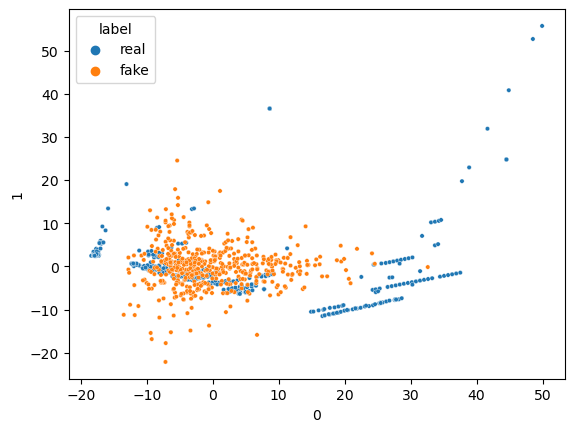

16/16 [==============================] - 0s 6ms/step


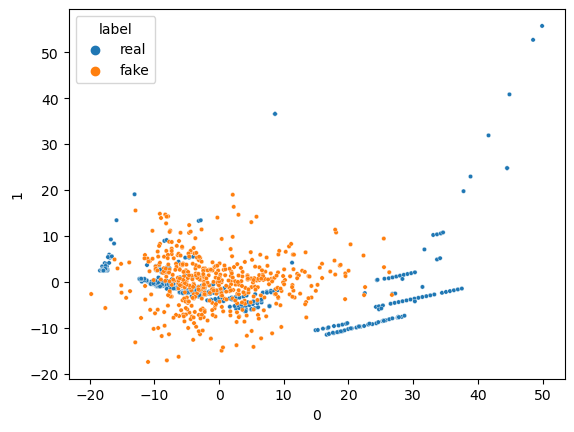

16/16 [==============================] - 0s 794us/step


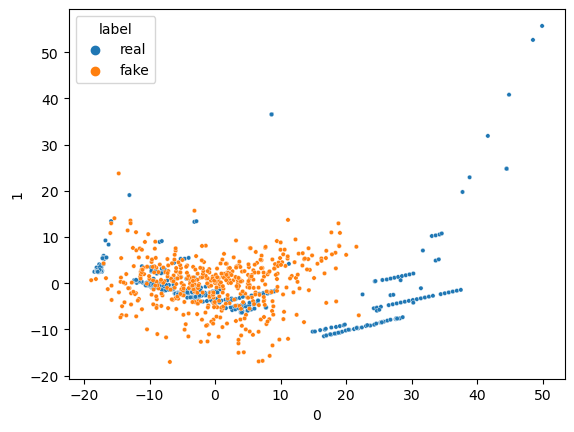

16/16 [==============================] - 0s 6ms/step


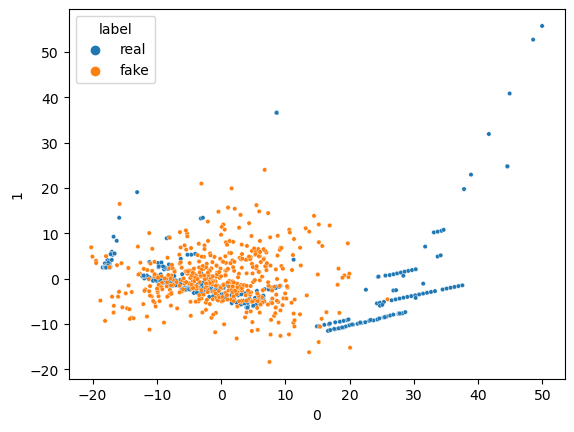

16/16 [==============================] - 0s 6ms/step


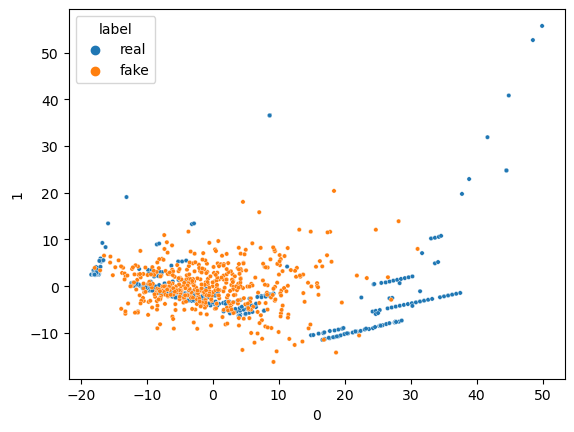

16/16 [==============================] - 0s 874us/step


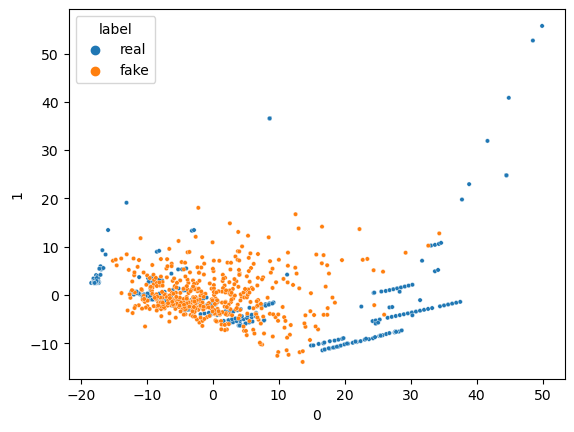

16/16 [==============================] - 0s 862us/step


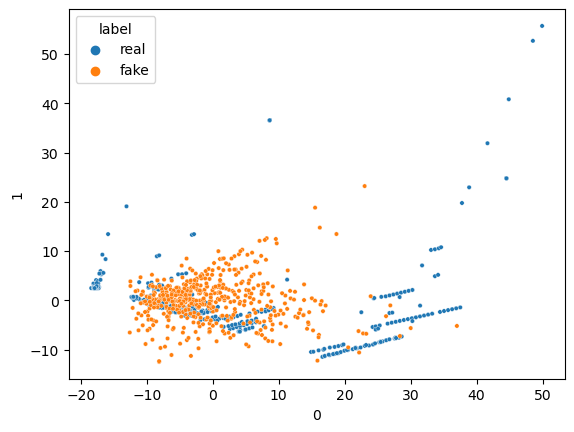

16/16 [==============================] - 0s 878us/step


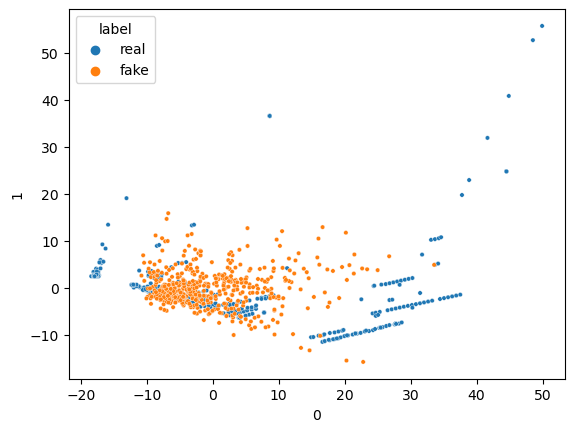

16/16 [==============================] - 0s 1ms/step


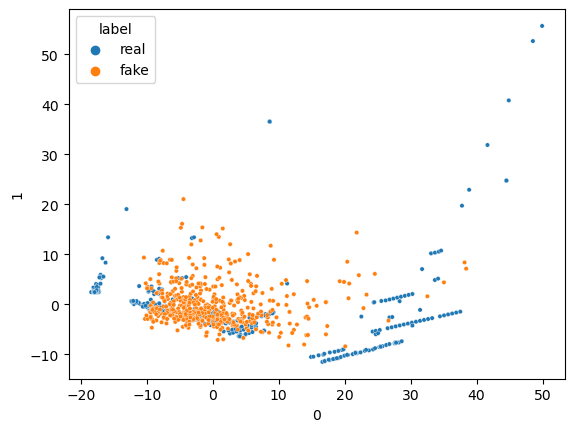

16/16 [==============================] - 0s 6ms/step


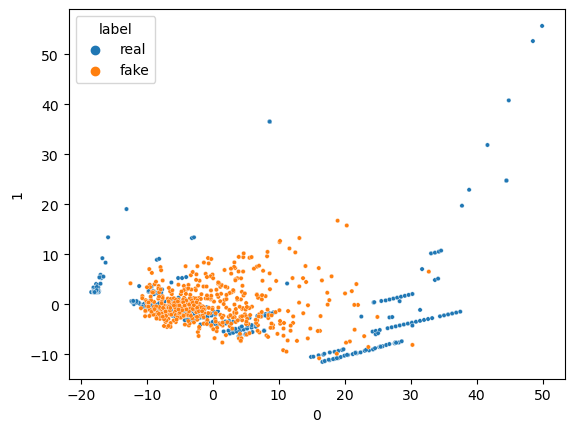

16/16 [==============================] - 0s 763us/step


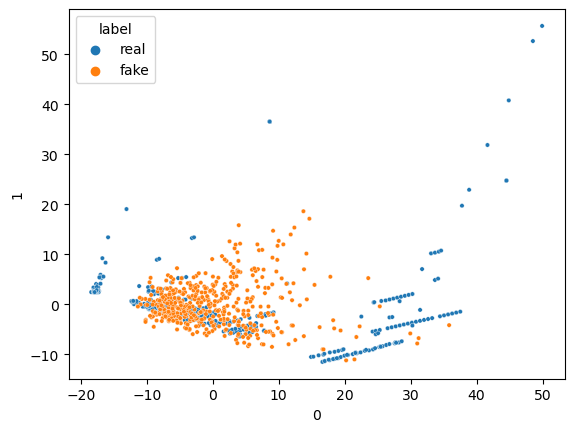

16/16 [==============================] - 0s 6ms/step


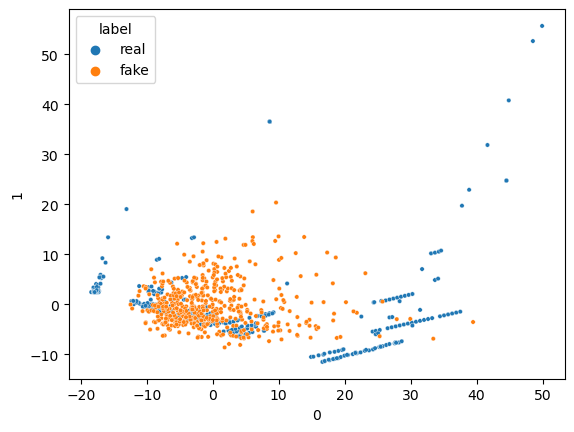

16/16 [==============================] - 0s 1ms/step


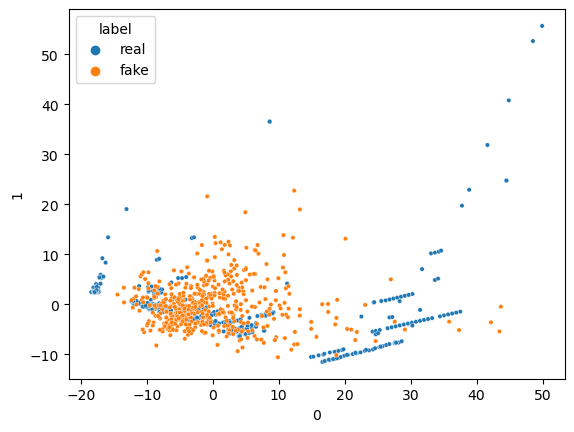

16/16 [==============================] - 0s 936us/step


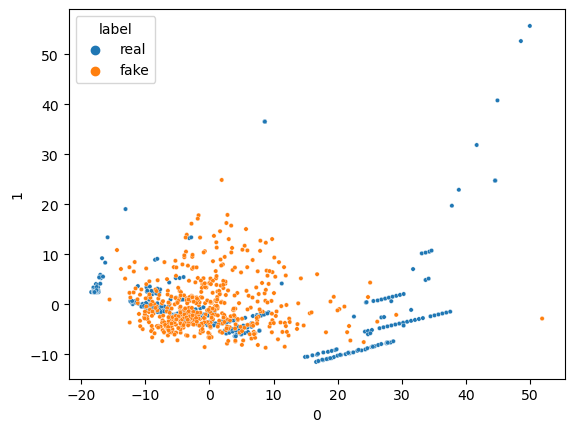

16/16 [==============================] - 0s 819us/step


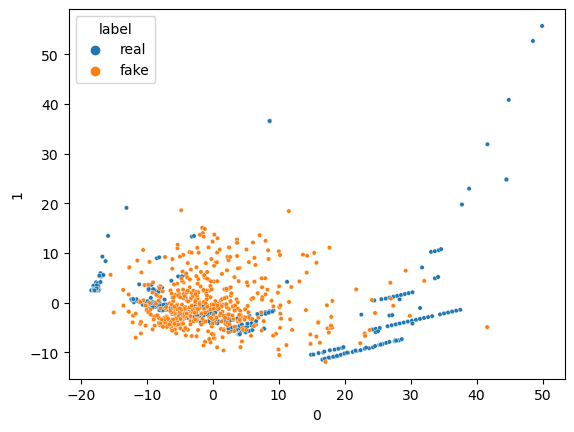

16/16 [==============================] - 0s 766us/step


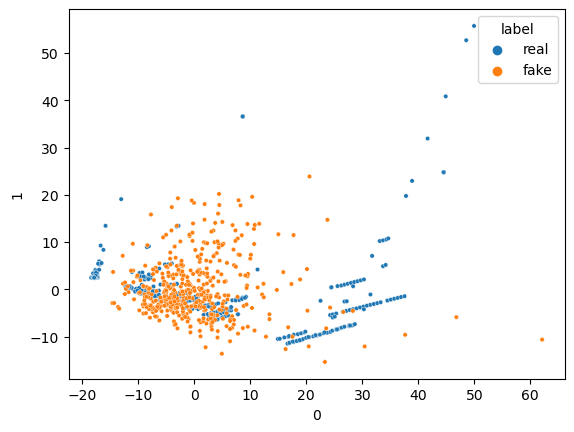

16/16 [==============================] - 0s 816us/step


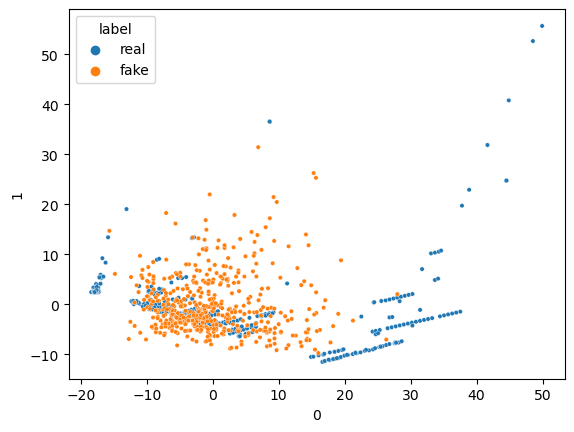

16/16 [==============================] - 0s 896us/step


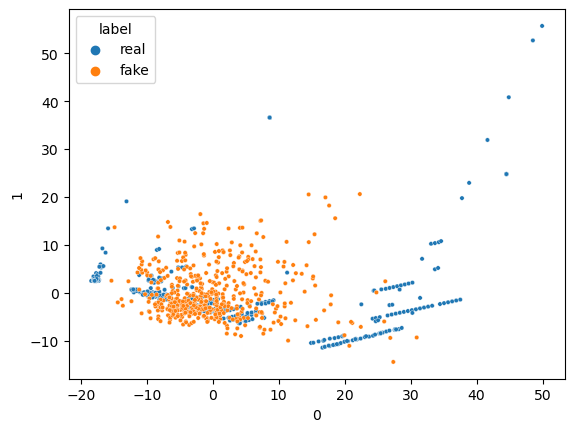

16/16 [==============================] - 0s 6ms/step


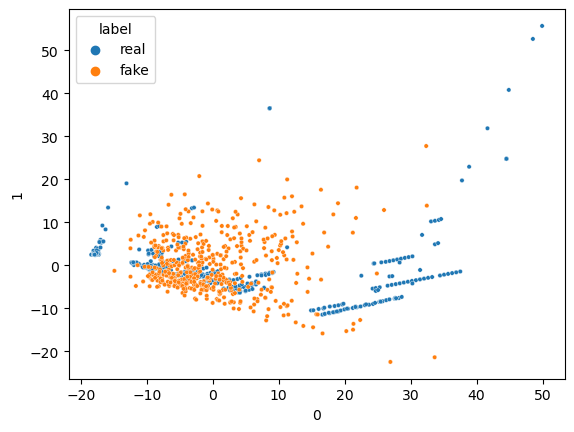

16/16 [==============================] - 0s 882us/step


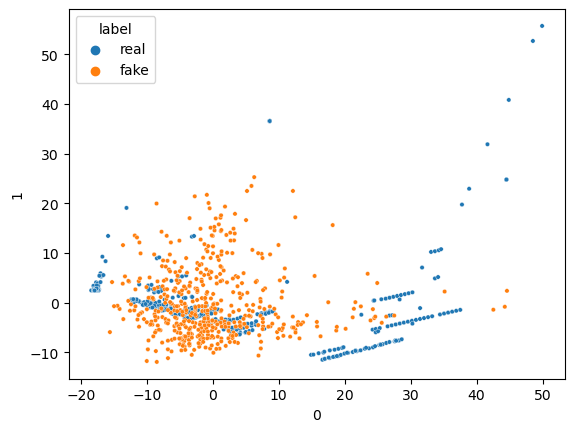

16/16 [==============================] - 0s 817us/step


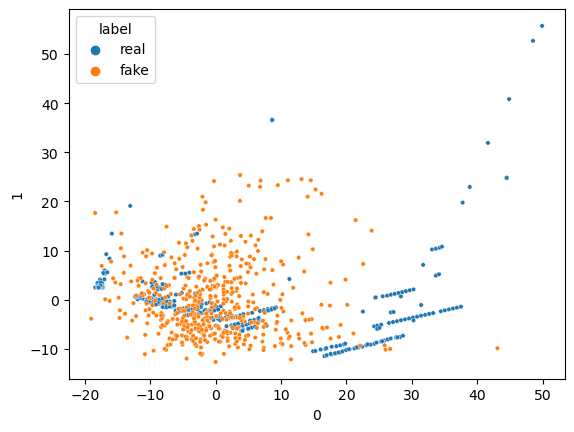

16/16 [==============================] - 0s 783us/step


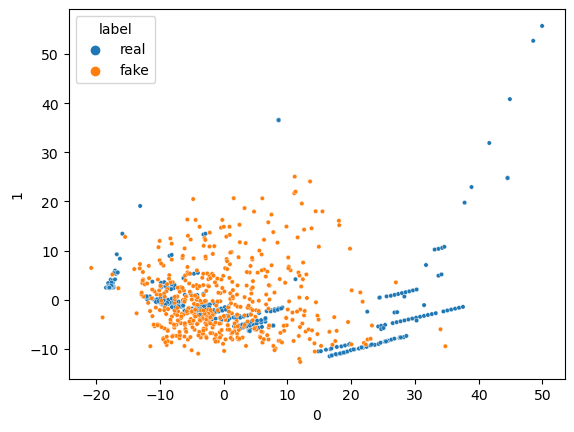

16/16 [==============================] - 0s 6ms/step


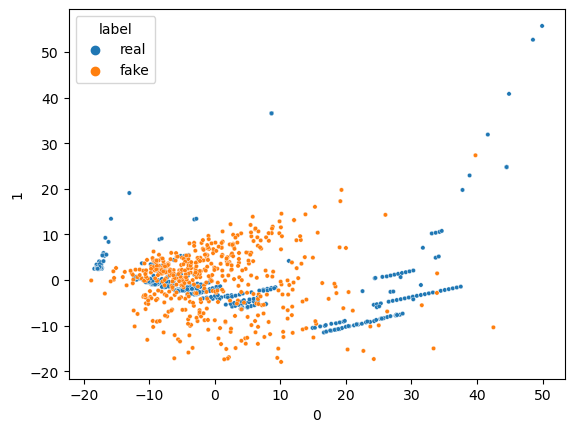

16/16 [==============================] - 0s 890us/step


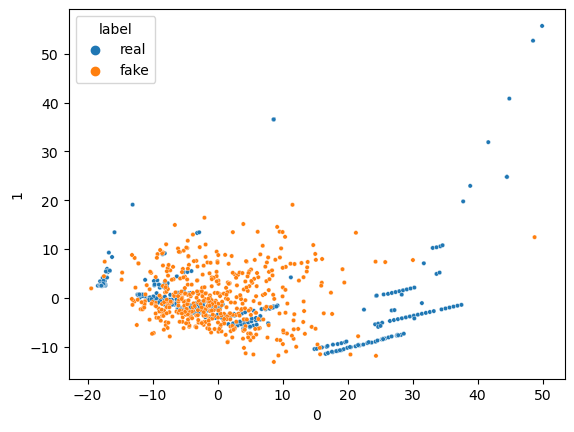

16/16 [==============================] - 0s 808us/step


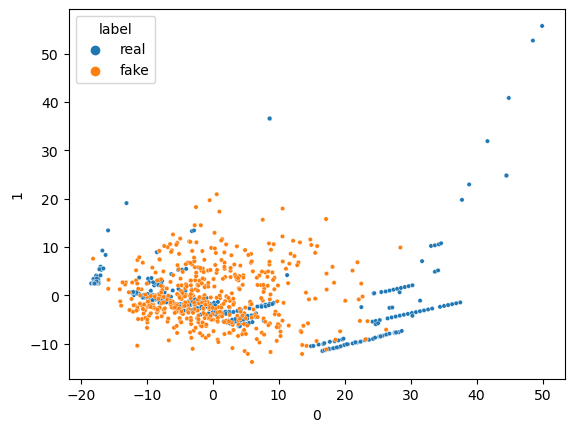

16/16 [==============================] - 0s 6ms/step


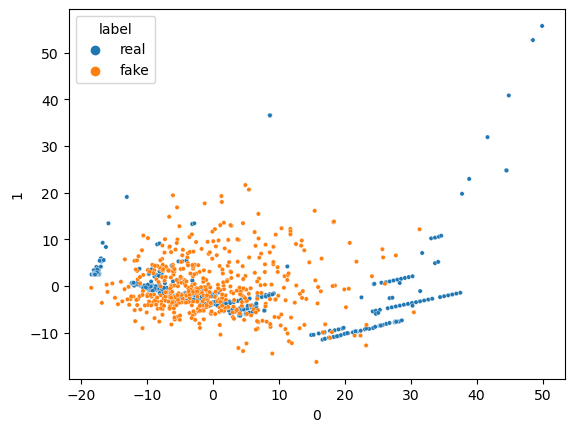

16/16 [==============================] - 0s 6ms/step


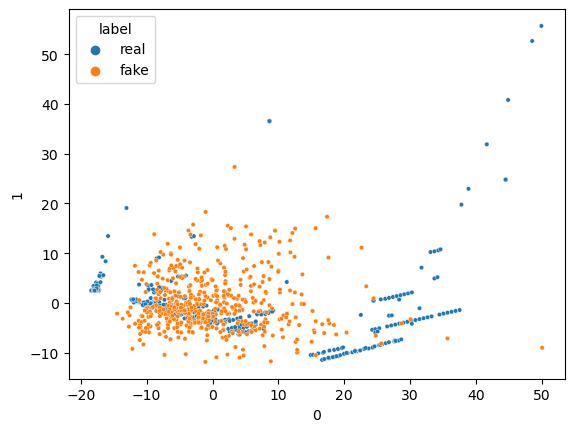

16/16 [==============================] - 0s 914us/step


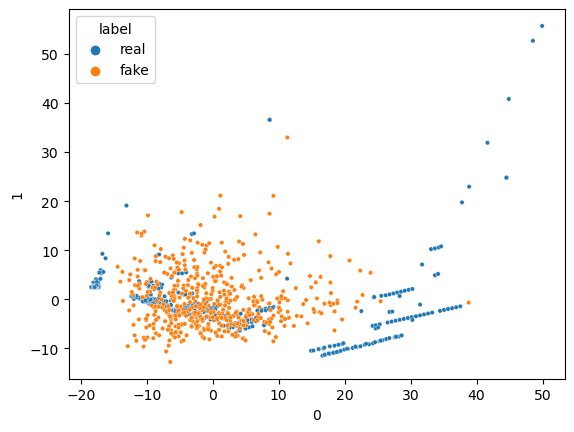

16/16 [==============================] - 0s 6ms/step


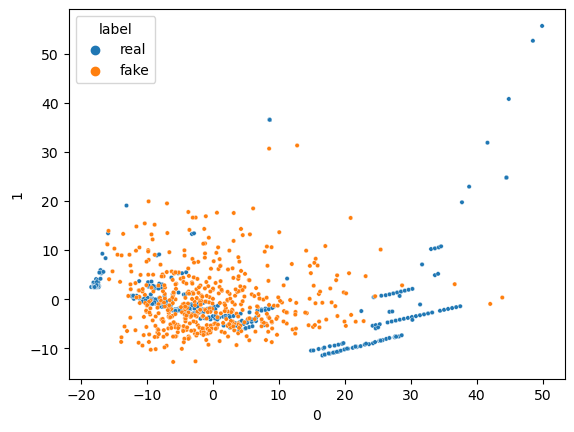

16/16 [==============================] - 0s 6ms/step


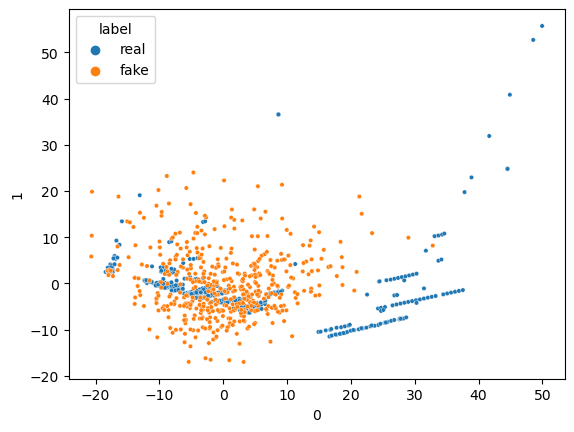

1/1 [==============================] - 0s 15ms/step


In [31]:
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator,discriminator)
gan.compile(optimizer='adam',loss='binary_crossentropy')

num_epochs=1000
batch_size=64
half_batch = int(batch_size/2)

for epoch in range(num_epochs):
    X_fake= generate_synthetic_data(generator,half_batch)
    y_fake =np.zeros((half_batch,1))
    
    X_real = data_fraud.drop('Class',axis=1).sample(half_batch)
    y_real = np.ones((half_batch,1))
    
    discriminator.trainable = True
    discriminator.train_on_batch(X_real,y_real)
    discriminator.train_on_batch(X_fake,y_fake)
    
    noise = np.random.normal(0,1,(batch_size ,29))
    gan.train_on_batch(noise, np.ones((batch_size,1)))
    
    if epoch%10==0:
        monitor_generator(generator)

### Generate synthetic data using the trained Generator

*   Generating 1000 fradulent data points using the trained generator
*   Comparing the distribution of `real` and `synthetic` fradulent data points.


In [34]:
synthetic_data = generate_synthetic_data(generator, 1000)
df = pd.DataFrame(synthetic_data)
df['label'] = 'fake'
df2 =data_fraud.drop('Class',axis=1)
df2['label'] = 'real'
df2.columns = df.columns
combined_df = pd.concat([df,df2])
combined_df

32/32 [==============================] - 0s 800us/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,-1.217642,2.042694,-7.330400,6.790043,2.251595,-3.082678,-2.038130,-2.416651,-4.149515,-6.377687,...,0.088473,-0.435322,-0.398053,-0.844472,0.211095,0.909804,0.681035,-0.202147,0.714066,fake
1,-1.174870,2.244117,-3.200877,1.878097,-0.138640,-2.170789,0.260997,-0.351816,-1.046167,-3.349732,...,-0.508699,-0.001006,-0.300089,-0.429828,0.475288,0.948444,-0.178641,-1.502069,0.676171,fake
2,0.327019,2.327023,-5.407828,4.523500,-1.115730,-3.545237,-2.861933,0.174861,-1.368227,-6.059561,...,0.874483,0.541390,0.114125,-1.288536,0.911546,0.714372,0.934530,-1.446584,1.025441,fake
3,-5.164792,-0.396460,-4.103091,2.115544,1.067467,-2.051374,-7.409719,-0.741843,-0.879685,-1.290369,...,0.076385,0.141844,-3.085032,-0.522539,1.324703,-0.516967,-0.157190,0.163685,0.150173,fake
4,-3.004063,3.372349,-4.435421,1.120406,-2.014690,-2.419045,-4.328763,0.885250,-1.232984,-4.340252,...,0.956528,-0.126021,-0.896733,-0.858748,0.980983,0.454321,-0.637652,-0.436754,0.331784,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [35]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>